In [2]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install pm4py
import pm4py
from datetime import datetime
import pandas as pd
!pip install -U ortools
import os

In [4]:
ocel = pm4py.read_ocel2_xml("/content/order-management.xml")

/usr/local/lib/python3.10/dist-packages/pm4py/util/dt_parsing/parser.py:77: UserWarning: ISO8601 strings are not fully supported with strpfromiso for Python versions below 3.11
  warnings.warn(


['orders', 'items', 'packages', 'customers', 'products', 'employees']

In [5]:
flattened_log_o = pm4py.ocel_flattening(ocel, "orders")
print(flattened_log_o)

                   ocel:eid      concept:name            time:timestamp  \
0            place_o-990001       place order 2023-04-03 10:08:18+00:00   
1            place_o-990002       place order 2023-04-03 14:36:55+00:00   
2            place_o-990003       place order 2023-04-03 21:31:23+00:00   
3            place_o-990004       place order 2023-04-04 10:30:50+00:00   
4          confirm_o-990002     confirm order 2023-04-04 14:09:41+00:00   
...                     ...               ...                       ...   
6561           pay_o-991907         pay order 2024-05-09 14:37:00+00:00   
6562  reminder_o-991917_565  payment reminder 2024-05-10 11:48:04+00:00   
6563  reminder_o-991986_566  payment reminder 2024-05-20 20:17:28+00:00   
6564           pay_o-991917         pay order 2024-05-23 16:40:59+00:00   
6565           pay_o-991986         pay order 2024-06-04 18:12:07+00:00   

     case:concept:name case:ocel:type  
0             o-990001         orders  
1             o-990

In [6]:
df = pm4py.convert_to_dataframe(flattened_log_o)
df.head()

,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,place_o-990001,place order,2023-04-03 10:08:18+00:00,o-990001,orders
1,place_o-990002,place order,2023-04-03 14:36:55+00:00,o-990002,orders
2,place_o-990003,place order,2023-04-03 21:31:23+00:00,o-990003,orders
3,place_o-990004,place order,2023-04-04 10:30:50+00:00,o-990004,orders
4,confirm_o-990002,confirm order,2023-04-04 14:09:41+00:00,o-990002,orders


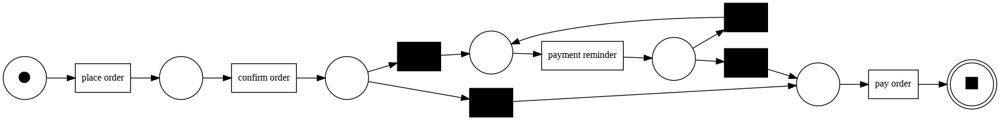

In [7]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_o)
pm4py.view_petri_net(net, im, fm)

In [8]:
replayed_traces_a = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_a


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(be0aafda-3669-4e13-9914-255eeb5a90bc, 'place order'),
   (5ec0baad-b8b8-4ab4-8fcc-a3d93a0dc363, 'confirm order'),
   (skip_1, None),
   (b8a274c1-eb93-498e-a7e7-7b5449115ed8, 'pay order')],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(be0aafda-3669-4e13-9914-255eeb5a90bc, 'place order'),
   (5ec0baad-b8b8-4ab4-8fcc-a3d93a0dc363, 'confirm order'),
   (skip_1, None),
   (b8a274c1-eb93-498e-a7e7-7b5449115ed8, 'pay order')],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  

In [9]:
fitness_a = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_a


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [10]:
precision_a = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_a


replaying log with TBR, completed traces ::   0%|          | 0/6 [00:00<?, ?it/s]

0.9997809899255365

In [11]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_a = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_a


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

0.960044016295738

In [12]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_a = simplicity_evaluator.apply(net)
simplicity_a

0.8823529411764706

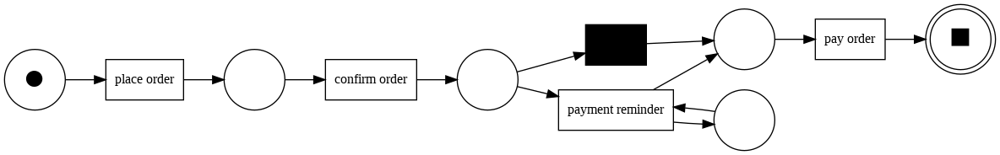

In [13]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_o, dependency_threshold=0.91)
pm4py.view_petri_net(net, im, fm)

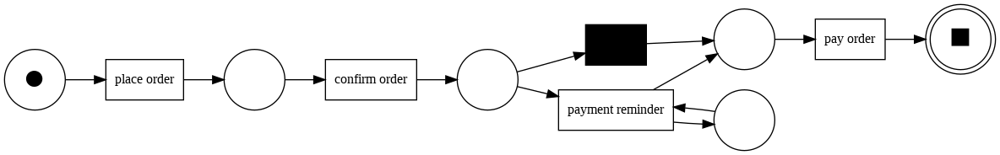

In [14]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_o, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [15]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=1)
pm4py.view_heuristics_net(heu_net)

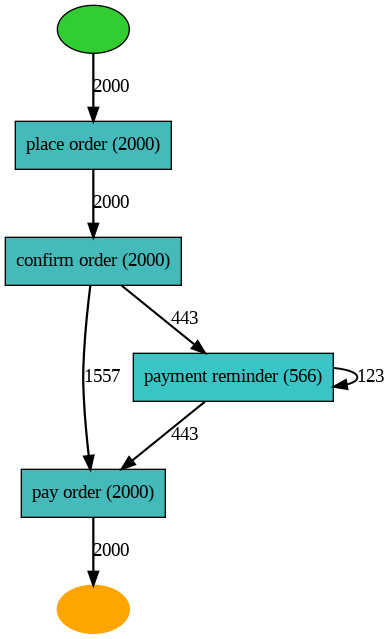

In [16]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=0.5)
pm4py.view_heuristics_net(heu_net)

In [17]:
replayed_traces_a = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

In [18]:
replayed_traces_a

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(place order, 'place order'),
   (confirm order, 'confirm order'),
   (hid_4, None),
   (pay order, 'pay order')],
  'reached_marking': ['sink0:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(place order, 'place order'),
   (confirm order, 'confirm order'),
   (hid_4, None),
   (pay order, 'pay order')],
  'reached_marking': ['sink0:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': False,
  'trace_fitness': 0.8333333333333334,
  'activated_transitions': [(place order, 'place order'),
   (confirm order, 'confirm order'),
   (payment reminder, 'payment reminder')

In [19]:
replayed_traces_a = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_a
fitness_a = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_a




replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

{'perc_fit_traces': 77.85,
 'average_trace_fitness': 0.9583833333333284,
 'log_fitness': 0.9470483674805875,
 'percentage_of_fitting_traces': 77.85}

In [20]:
precision_a = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_a


replaying log with TBR, completed traces ::   0%|          | 0/6 [00:00<?, ?it/s]

1.0

In [21]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_a = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_a


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

0.9731083922923526

In [22]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_a = simplicity_evaluator.apply(net)
simplicity_a

0.8461538461538463

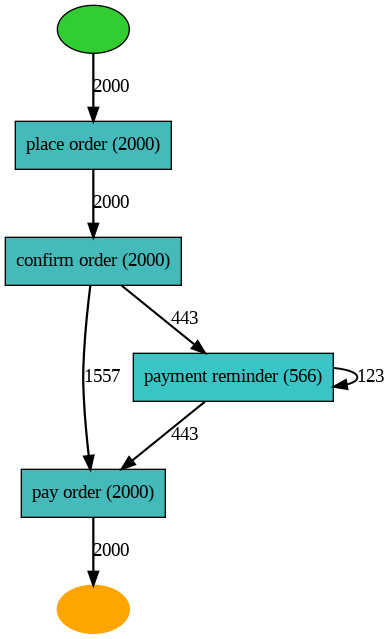

In [23]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=0.91)
pm4py.view_heuristics_net(heu_net)

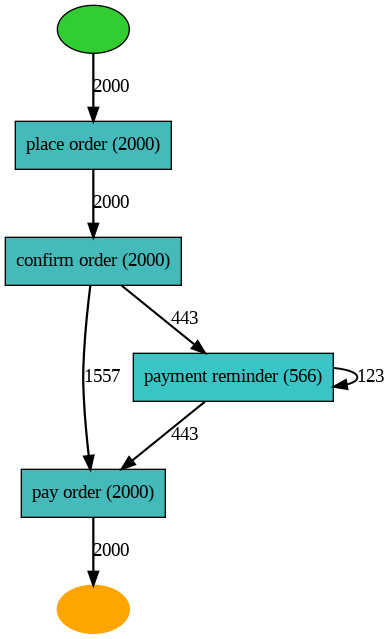

In [24]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [25]:
flattened_log_w = pm4py.ocel_flattening(ocel, "items")
print(flattened_log_w)


             ocel:eid concept:name            time:timestamp  \
0      place_o-990001  place order 2023-04-03 10:08:18+00:00   
1      place_o-990001  place order 2023-04-03 10:08:18+00:00   
2      place_o-990001  place order 2023-04-03 10:08:18+00:00   
3       pick_i-880003    pick item 2023-04-03 11:21:49+00:00   
4      place_o-990002  place order 2023-04-03 14:36:55+00:00   
...               ...          ...                       ...   
60930    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
60931    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
60932    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
60933    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
60934    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   

      case:concept:name case:ocel:type  
0              i-880001          items  
1              i-880002          items  
2              i-880003          items  
3              i-880003          items  
4              i-880004   

In [26]:
df = pm4py.convert_to_dataframe(flattened_log_w)
df.head()


,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,place_o-990001,place order,2023-04-03 10:08:18+00:00,i-880001,items
1,place_o-990001,place order,2023-04-03 10:08:18+00:00,i-880002,items
2,place_o-990001,place order,2023-04-03 10:08:18+00:00,i-880003,items
3,pick_i-880003,pick item,2023-04-03 11:21:49+00:00,i-880003,items
4,place_o-990002,place order,2023-04-03 14:36:55+00:00,i-880004,items


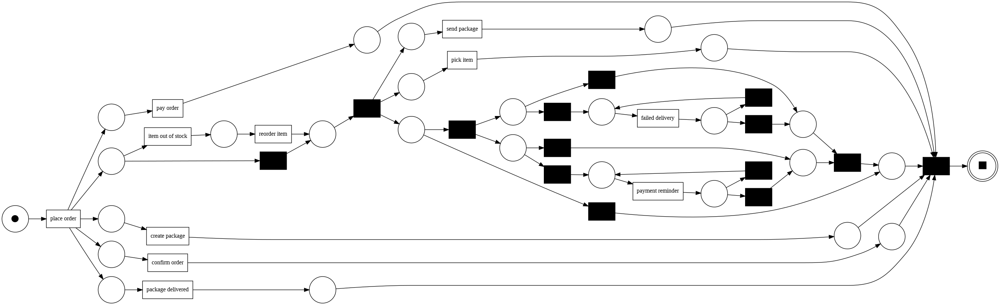

In [27]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_w)
pm4py.view_petri_net(net, im, fm)

In [28]:
replayed_traces_w = pm4py.conformance_diagnostics_token_based_replay(flattened_log_w, net, im, fm)
replayed_traces_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(f2962006-158a-441e-ac57-1f727a8e397b, 'place order'),
   (skip_4, None),
   (tauSplit_5, None),
   (4099c55f-349f-45dd-b64f-5de75249f878, 'pick item'),
   (97f82cd1-4f76-4c8e-bda4-f4c81fc5eb60, 'confirm order'),
   (9ecbf335-c31d-4d5f-b833-0289da4a153d, 'pay order'),
   (111e26d4-a68e-4d63-882c-f3c49a22f6aa, 'create package'),
   (84d84f24-ba3e-45a3-aa63-449e15b8c4e5, 'send package'),
   (f9b4cea8-f858-4f88-87da-fc21b4225478, 'package delivered'),
   (skip_7, None),
   (tauJoin_3, None)],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 18,
  'remaining_tokens': 0,
  'produced_tokens': 18},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(f2962006-158a-441e-ac57-1f727a8e397b, 'place order'),
   (skip_4, None),
   (tauSplit_5, None),
   (4099c55f-349f-45dd-b64f-5de75249f878, 'pic

In [29]:
fitness_w = pm4py.fitness_token_based_replay(flattened_log_w, net, im, fm)
fitness_w



replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [30]:
precision_w = pm4py.precision_token_based_replay(flattened_log_w, net, im, fm)
precision_w


replaying log with TBR, completed traces ::   0%|          | 0/550 [00:00<?, ?it/s]

0.5602098635886674

In [31]:

from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_w = generalization_evaluator.apply(flattened_log_w, net, im, fm)
generalization_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

0.9797938998759402

In [32]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_w = simplicity_evaluator.apply(net)
simplicity_w

0.6842105263157894

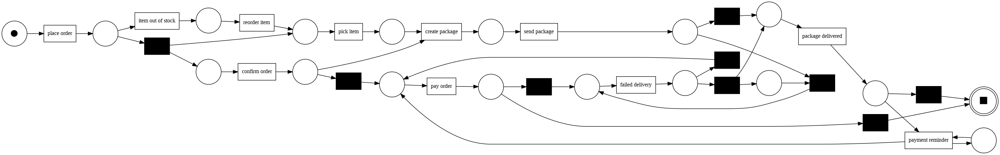

In [33]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_w, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

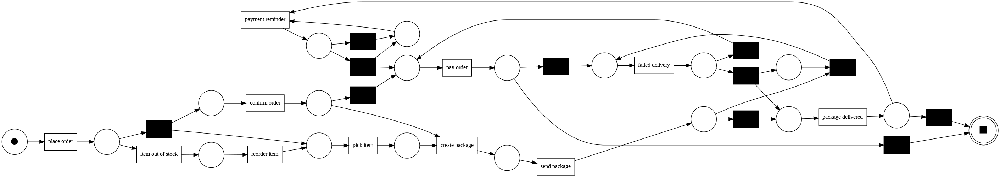

In [34]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_w, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [35]:
replayed_traces_w = pm4py.conformance_diagnostics_token_based_replay(flattened_log_w, net, im, fm)
replayed_traces_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

[{'trace_is_fit': False,
  'trace_fitness': 0.9230769230769231,
  'activated_transitions': [(place order, 'place order'),
   (hid_25, None),
   (pick item, 'pick item'),
   (confirm order, 'confirm order'),
   (hid_13, None),
   (pay order, 'pay order'),
   (create package, 'create package'),
   (send package, 'send package'),
   (hid_17, None),
   (package delivered, 'package delivered'),
   (hid_22, None)],
  'reached_marking': ['intplace_pay order:1', 'sink0:1'],
  'enabled_transitions_in_marking': {(failed delivery, 'failed delivery')},
  'transitions_with_problems': [(create package, 'create package')],
  'missing_tokens': 1,
  'consumed_tokens': 13,
  'remaining_tokens': 1,
  'produced_tokens': 13},
 {'trace_is_fit': False,
  'trace_fitness': 0.9230769230769231,
  'activated_transitions': [(place order, 'place order'),
   (hid_25, None),
   (pick item, 'pick item'),
   (confirm order, 'confirm order'),
   (hid_13, None),
   (pay order, 'pay order'),
   (create package, 'create pa

In [36]:
fitness_w = pm4py.fitness_token_based_replay(flattened_log_w, net, im, fm)
fitness_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0,
 'average_trace_fitness': 0.9025045522598224,
 'log_fitness': 0.9000227881260716,
 'percentage_of_fitting_traces': 0.0}

In [37]:
precision_w = pm4py.precision_token_based_replay(flattened_log_w, net, im, fm)
precision_w


replaying log with TBR, completed traces ::   0%|          | 0/550 [00:00<?, ?it/s]

0.9790028917665217

In [38]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_w = generalization_evaluator.apply(flattened_log_w, net, im, fm)
generalization_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

0.9338989759755985

In [39]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_w = simplicity_evaluator.apply(net)
simplicity_w

0.6949152542372882

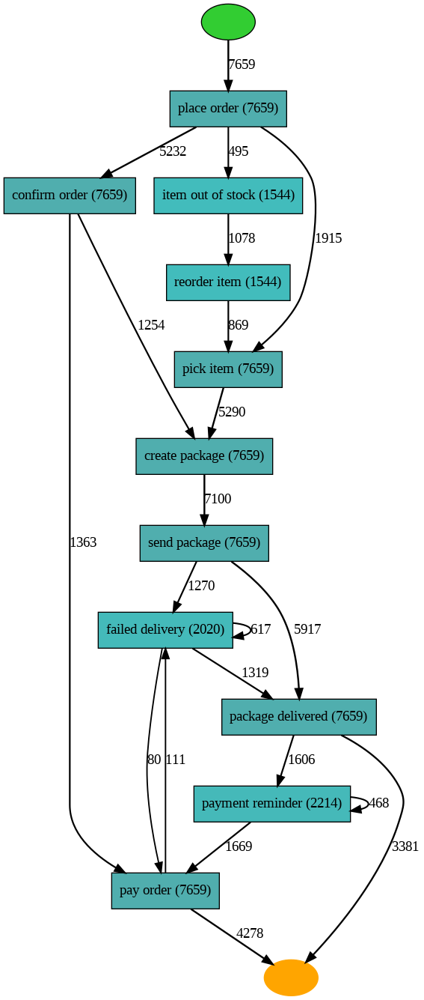

In [40]:
heu_net = pm4py.discover_heuristics_net(flattened_log_w, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [41]:
flattened_log_o = pm4py.ocel_flattening(ocel, "packages")
print(flattened_log_o)


              ocel:eid       concept:name            time:timestamp  \
0      create_p-660001     create package 2023-04-07 23:00:00+00:00   
1        send_p-660001       send package 2023-04-10 08:40:42+00:00   
2     deliver_p-660001  package delivered 2023-04-11 09:03:27+00:00   
3      create_p-660002     create package 2023-04-12 07:52:12+00:00   
4      create_p-660003     create package 2023-04-12 13:59:22+00:00   
...                ...                ...                       ...   
3690     send_p-661127       send package 2024-05-27 09:58:49+00:00   
3691  deliver_p-661127  package delivered 2024-05-28 10:49:37+00:00   
3692   create_p-661128     create package 2024-05-31 23:00:00+00:00   
3693     send_p-661128       send package 2024-06-03 08:20:59+00:00   
3694  deliver_p-661128  package delivered 2024-06-03 10:17:54+00:00   

     case:concept:name case:ocel:type  
0             p-660001       packages  
1             p-660001       packages  
2             p-660001     

In [42]:
df = pm4py.convert_to_dataframe(flattened_log_o)
df.head()


,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,create_p-660001,create package,2023-04-07 23:00:00+00:00,p-660001,packages
1,send_p-660001,send package,2023-04-10 08:40:42+00:00,p-660001,packages
2,deliver_p-660001,package delivered,2023-04-11 09:03:27+00:00,p-660001,packages
3,create_p-660002,create package,2023-04-12 07:52:12+00:00,p-660002,packages
4,create_p-660003,create package,2023-04-12 13:59:22+00:00,p-660003,packages


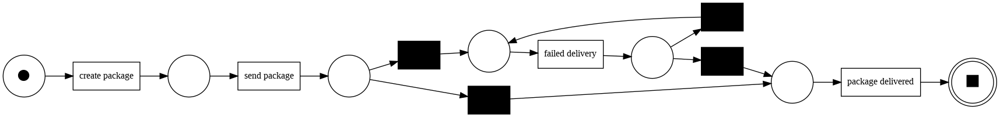

In [43]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_o)
pm4py.view_petri_net(net, im, fm)

In [44]:
replayed_traces_o = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(3167b8a3-4c75-465f-9c64-cb7beb44d4ca, 'create package'),
   (9bd54d1c-2955-4a46-a153-66e5d4d87947, 'send package'),
   (skip_1, None),
   (4664a508-0b2f-46d7-8b6d-bb022c8661c1, 'package delivered')],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(3167b8a3-4c75-465f-9c64-cb7beb44d4ca, 'create package'),
   (9bd54d1c-2955-4a46-a153-66e5d4d87947, 'send package'),
   (skip_1, None),
   (4664a508-0b2f-46d7-8b6d-bb022c8661c1, 'package delivered')],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'tra

In [45]:
fitness_o = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [46]:
precision_o = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_o


replaying log with TBR, completed traces ::   0%|          | 0/9 [00:00<?, ?it/s]

0.9996104402025711

In [47]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_o = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

0.9478303300200297

In [48]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_o = simplicity_evaluator.apply(net)
simplicity_o

0.8823529411764706

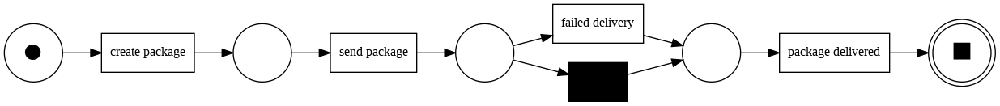

In [49]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_o, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [50]:
replayed_traces_o = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(create package, 'create package'),
   (send package, 'send package'),
   (hid_4, None),
   (package delivered, 'package delivered')],
  'reached_marking': ['sink0:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(create package, 'create package'),
   (send package, 'send package'),
   (hid_4, None),
   (package delivered, 'package delivered')],
  'reached_marking': ['sink0:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(create package, 'create package'),
   (send package, 'send package'),
   (hid_4, No

In [51]:
fitness_o = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

{'perc_fit_traces': 94.23758865248227,
 'average_trace_fitness': 0.9874692018973934,
 'log_fitness': 0.9830922084713265,
 'percentage_of_fitting_traces': 94.23758865248227}

In [52]:
precision_o = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_o


replaying log with TBR, completed traces ::   0%|          | 0/9 [00:00<?, ?it/s]

1.0

In [53]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_o = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

0.9641788884157065

In [54]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_o = simplicity_evaluator.apply(net)
simplicity_o

1.0

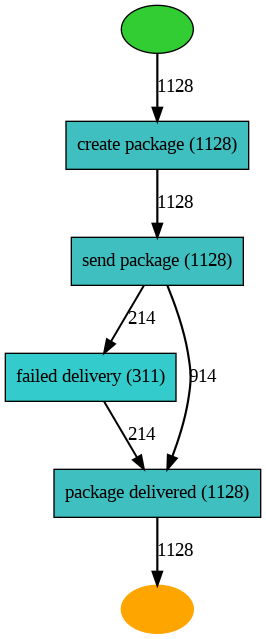

In [55]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [56]:
flattened_log_cr = pm4py.ocel_flattening(ocel, "customers")
print(flattened_log_cr)


              ocel:eid   concept:name            time:timestamp  \
0       place_o-990001    place order 2023-04-03 10:08:18+00:00   
1       place_o-990002    place order 2023-04-03 14:36:55+00:00   
2       place_o-990003    place order 2023-04-03 21:31:23+00:00   
3       place_o-990004    place order 2023-04-04 10:30:50+00:00   
4     confirm_o-990002  confirm order 2023-04-04 14:09:41+00:00   
...                ...            ...                       ...   
3995  confirm_o-991997  confirm order 2024-03-25 09:44:24+00:00   
3996  confirm_o-991992  confirm order 2024-03-25 10:18:10+00:00   
3997  confirm_o-991998  confirm order 2024-03-25 12:15:25+00:00   
3998  confirm_o-991996  confirm order 2024-03-25 16:59:02+00:00   
3999  confirm_o-992000  confirm order 2024-03-26 13:19:17+00:00   

                      case:concept:name case:ocel:type  
0              AlpenTech Innovations AG      customers  
1              AlpenTech Innovations AG      customers  
2                Celtica

In [57]:
df = pm4py.convert_to_dataframe(flattened_log_cr)
df.head()


,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,place_o-990001,place order,2023-04-03 10:08:18+00:00,AlpenTech Innovations AG,customers
1,place_o-990002,place order,2023-04-03 14:36:55+00:00,AlpenTech Innovations AG,customers
2,place_o-990003,place order,2023-04-03 21:31:23+00:00,Celtica Green Farms Oy,customers
3,place_o-990004,place order,2023-04-04 10:30:50+00:00,Baltic Wave Energies Ltd.,customers
4,confirm_o-990002,confirm order,2023-04-04 14:09:41+00:00,AlpenTech Innovations AG,customers


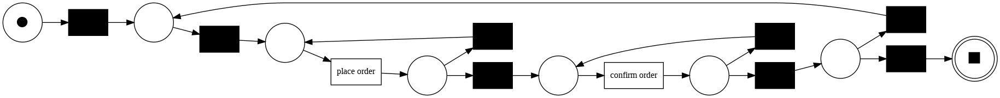

In [58]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_cr)
pm4py.view_petri_net(net, im, fm)

In [59]:
replayed_traces_cr = pm4py.conformance_diagnostics_token_based_replay(flattened_log_cr, net, im, fm)
replayed_traces_cr


replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(tau_1, None),
   (init_loop_5, None),
   (5ba57834-35a7-4e00-8aa3-52d73801399f, 'place order'),
   (skip_7, None),
   (5ba57834-35a7-4e00-8aa3-52d73801399f, 'place order'),
   (skip_8, None),
   (8e9d8a7f-4f13-4d57-913a-38a73777041c, 'confirm order'),
   (skip_11, None),
   (8e9d8a7f-4f13-4d57-913a-38a73777041c, 'confirm order'),
   (skip_12, None),
   (skip_13, None),
   (init_loop_5, None),
   (5ba57834-35a7-4e00-8aa3-52d73801399f, 'place order'),
   (skip_8, None),
   (8e9d8a7f-4f13-4d57-913a-38a73777041c, 'confirm order'),
   (skip_12, None),
   (skip_13, None),
   (init_loop_5, None),
   (5ba57834-35a7-4e00-8aa3-52d73801399f, 'place order'),
   (skip_8, None),
   (8e9d8a7f-4f13-4d57-913a-38a73777041c, 'confirm order'),
   (skip_12, None),
   (skip_13, None),
   (init_loop_5, None),
   (5ba57834-35a7-4e00-8aa3-52d73801399f, 'place order'),
   (skip_8, None),
   (8e9d8a7f-4f13-4d57-913a-38a73777041c, 'confi

In [60]:
fitness_cr = pm4py.fitness_token_based_replay(flattened_log_cr, net, im, fm)
fitness_cr


replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [61]:
precision_cr = pm4py.precision_token_based_replay(flattened_log_cr, net, im, fm)
precision_cr


replaying log with TBR, completed traces ::   0%|          | 0/3819 [00:00<?, ?it/s]

0.6741854636591479

In [62]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_cr = generalization_evaluator.apply(flattened_log_cr, net, im, fm)
generalization_cr


replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

0.9246299176795403

In [63]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_cr = simplicity_evaluator.apply(net)
simplicity_cr

0.8181818181818181

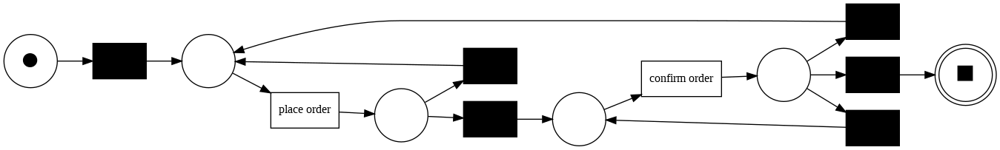

In [64]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_cr, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [65]:
heu_net = pm4py.discover_heuristics_net(flattened_log_cr, dependency_threshold=1)
pm4py.view_heuristics_net(heu_net)

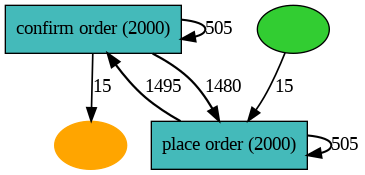

In [66]:
heu_net = pm4py.discover_heuristics_net(flattened_log_cr, dependency_threshold=0.5)
pm4py.view_heuristics_net(heu_net)

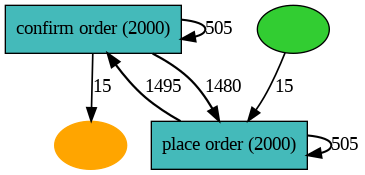

In [67]:
heu_net = pm4py.discover_heuristics_net(flattened_log_cr, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [68]:
replayed_traces_w = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_w
fitness_a = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_a
precision_a = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_a
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_a = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_a
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_a = simplicity_evaluator.apply(net)
simplicity_a

replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/9 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

0.7777777777777779

In [69]:
flattened_log_pr = pm4py.ocel_flattening(ocel, "products")
print(flattened_log_pr)

             ocel:eid concept:name            time:timestamp  \
0      place_o-990001  place order 2023-04-03 10:08:18+00:00   
1      place_o-990001  place order 2023-04-03 10:08:18+00:00   
2       pick_i-880003    pick item 2023-04-03 11:21:49+00:00   
3      place_o-990002  place order 2023-04-03 14:36:55+00:00   
4      place_o-990002  place order 2023-04-03 14:36:55+00:00   
...               ...          ...                       ...   
54692    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
54693    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
54694    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
54695    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
54696    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   

       case:concept:name case:ocel:type  
0                   Echo       products  
1          iPhone 11 Pro       products  
2          iPhone 11 Pro       products  
3      Kindle Paperwhite       products  
4            MacBook 

In [70]:
df = pm4py.convert_to_dataframe(flattened_log_pr)
df.head()

,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,place_o-990001,place order,2023-04-03 10:08:18+00:00,Echo,products
1,place_o-990001,place order,2023-04-03 10:08:18+00:00,iPhone 11 Pro,products
2,pick_i-880003,pick item,2023-04-03 11:21:49+00:00,iPhone 11 Pro,products
3,place_o-990002,place order,2023-04-03 14:36:55+00:00,Kindle Paperwhite,products
4,place_o-990002,place order,2023-04-03 14:36:55+00:00,MacBook Pro,products


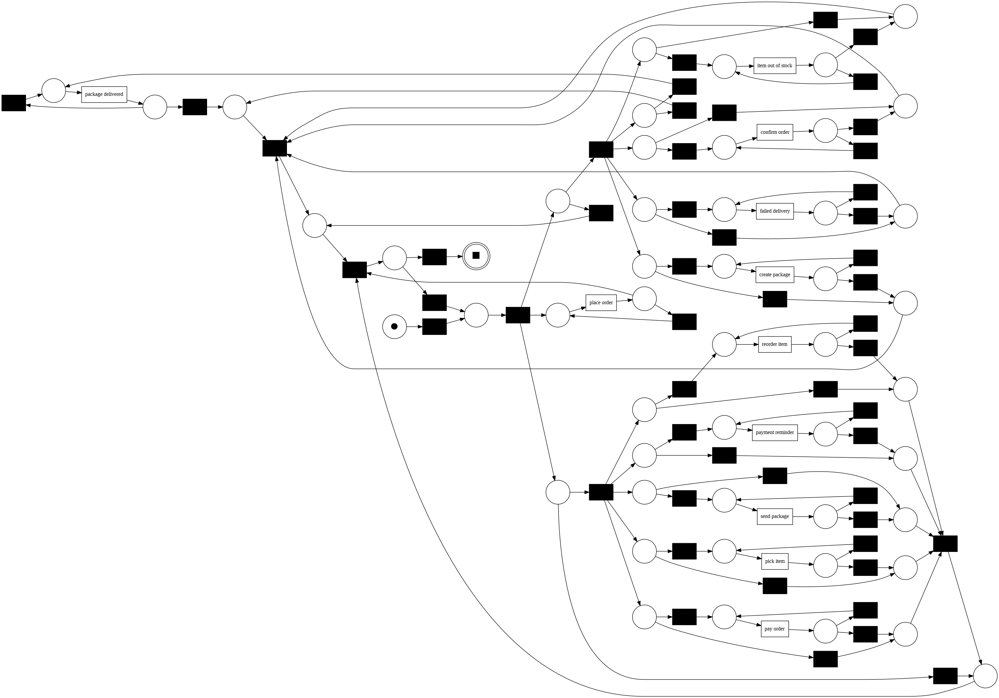

In [71]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_pr)
pm4py.view_petri_net(net, im, fm)

In [72]:
replayed_traces_pr = pm4py.conformance_diagnostics_token_based_replay(flattened_log_pr, net, im, fm)
replayed_traces_pr

replaying log with TBR, completed traces ::   0%|          | 0/20 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(tau_1, None),
   (tauSplit_5, None),
   (91c3f0e7-c5e8-48a7-88de-f85b622f2877, 'place order'),
   (tauSplit_40, None),
   (init_loop_58, None),
   (515e5dc6-04ca-485a-a367-b990a16d4927, 'pick item'),
   (skip_9, None),
   (91c3f0e7-c5e8-48a7-88de-f85b622f2877, 'place order'),
   (skip_60, None),
   (515e5dc6-04ca-485a-a367-b990a16d4927, 'pick item'),
   (tauSplit_12, None),
   (init_loop_30, None),
   (ef1a6790-5e58-4d09-a15e-bf55e750de9f, 'confirm order'),
   (skip_9, None),
   (91c3f0e7-c5e8-48a7-88de-f85b622f2877, 'place order'),
   (skip_60, None),
   (515e5dc6-04ca-485a-a367-b990a16d4927, 'pick item'),
   (init_loop_63, None),
   (b9a80971-1c3d-4b09-af50-8758ea2ecf3f, 'pay order'),
   (skip_32, None),
   (ef1a6790-5e58-4d09-a15e-bf55e750de9f, 'confirm order'),
   (init_loop_25, None),
   (540f5f04-f8b0-4e8c-b19c-4bbf68d3660a, 'item out of stock'),
   (init_loop_48, None),
   (4f56540e-8c13-48a6-8d2a-e905d

In [73]:
fitness_pr = pm4py.fitness_token_based_replay(flattened_log_pr, net, im, fm)
fitness_pr

replaying log with TBR, completed traces ::   0%|          | 0/20 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [74]:
precision_pr = pm4py.precision_token_based_replay(flattened_log_pr, net, im, fm)
precision_pr


KeyboardInterrupt: 

In [75]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_pr = generalization_evaluator.apply(flattened_log_pr, net, im, fm)
generalization_pr

replaying log with TBR, completed traces ::   0%|          | 0/20 [00:00<?, ?it/s]

0.6884824922882147

In [76]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_pr = simplicity_evaluator.apply(net)
simplicity_pr

0.6312849162011173

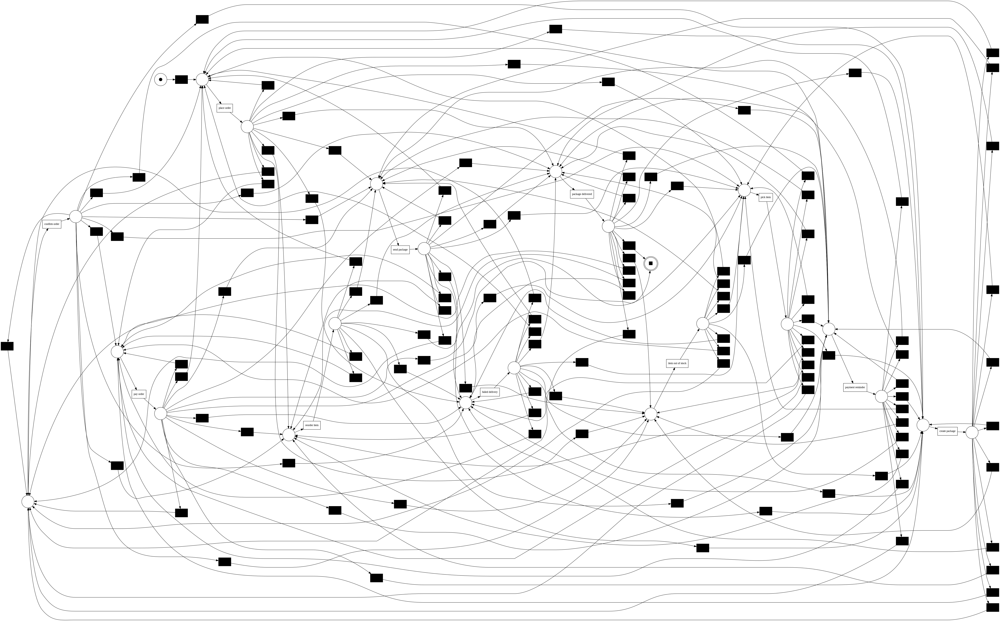

In [77]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_pr, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [78]:
heu_net = pm4py.discover_heuristics_net(flattened_log_pr, dependency_threshold=1)
pm4py.view_heuristics_net(heu_net)

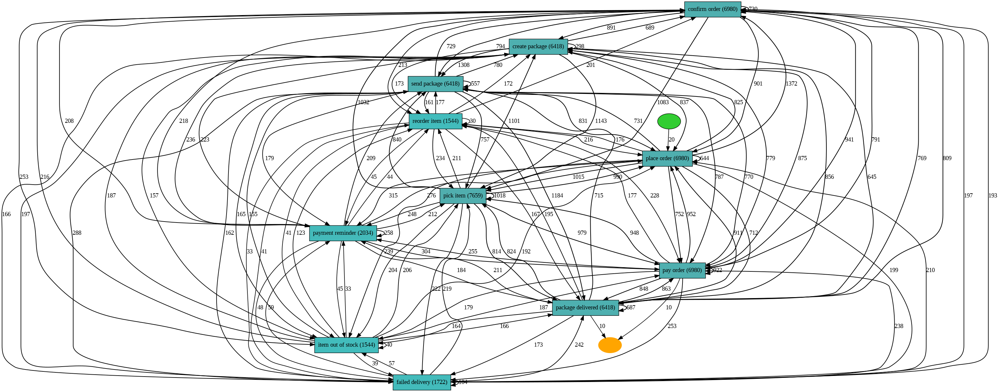

In [79]:
heu_net = pm4py.discover_heuristics_net(flattened_log_pr, dependency_threshold=0.5)
pm4py.view_heuristics_net(heu_net)

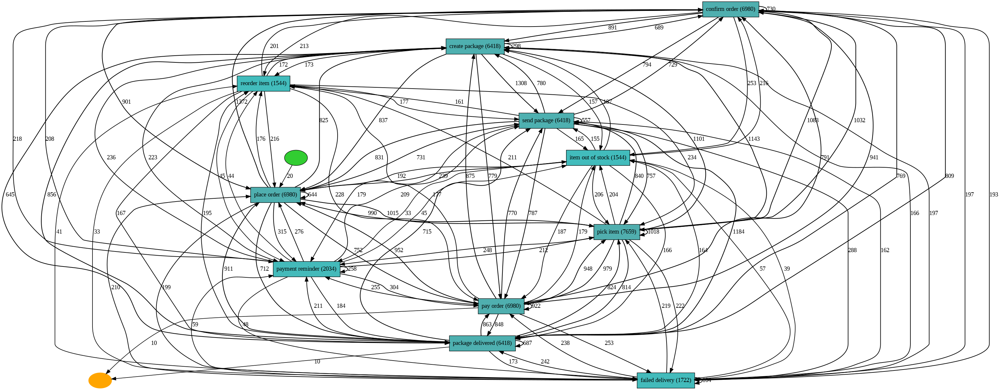

In [80]:
heu_net = pm4py.discover_heuristics_net(flattened_log_pr, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [81]:
flattened_log_em = pm4py.ocel_flattening(ocel, "employees")
print(flattened_log_em)

                    ocel:eid       concept:name            time:timestamp  \
0              pick_i-880003          pick item 2023-04-03 11:21:49+00:00   
1              pick_i-880001          pick item 2023-04-04 07:50:21+00:00   
2              pick_i-880006          pick item 2023-04-04 08:01:31+00:00   
3              pick_i-880020          pick item 2023-04-04 13:08:41+00:00   
4      out_of_stock_i-880016  item out of stock 2023-04-04 13:42:47+00:00   
...                      ...                ...                       ...   
17565       deliver_p-661127  package delivered 2024-05-28 10:49:37+00:00   
17566        create_p-661128     create package 2024-05-31 23:00:00+00:00   
17567          send_p-661128       send package 2024-06-03 08:20:59+00:00   
17568          send_p-661128       send package 2024-06-03 08:20:59+00:00   
17569       deliver_p-661128  package delivered 2024-06-03 10:17:54+00:00   

                  case:concept:name case:ocel:type  
0      Leah Tacke gena

In [82]:
df = pm4py.convert_to_dataframe(flattened_log_em)
df.head()

,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,pick_i-880003,pick item,2023-04-03 11:21:49+00:00,Leah Tacke genannt Unterberg,employees
1,pick_i-880001,pick item,2023-04-04 07:50:21+00:00,Leah Tacke genannt Unterberg,employees
2,pick_i-880006,pick item,2023-04-04 08:01:31+00:00,Leah Tacke genannt Unterberg,employees
3,pick_i-880020,pick item,2023-04-04 13:08:41+00:00,Benedikt Knopp,employees
4,out_of_stock_i-880016,item out of stock,2023-04-04 13:42:47+00:00,Benedikt Knopp,employees


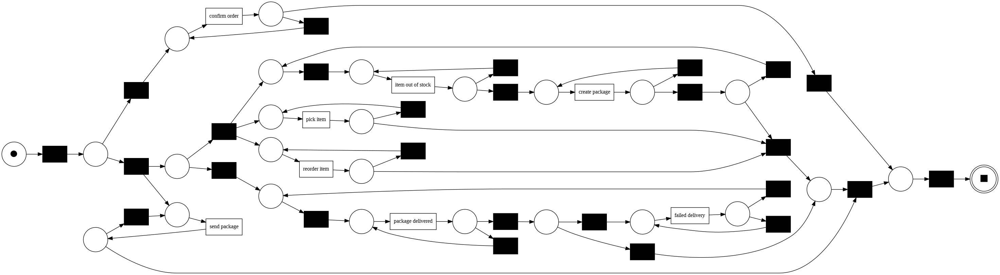

In [83]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_em)
pm4py.view_petri_net(net, im, fm)

In [84]:
replayed_traces_em = pm4py.conformance_diagnostics_token_based_replay(flattened_log_pr, net, im, fm)
replayed_traces_em

replaying log with TBR, completed traces ::   0%|          | 0/20 [00:00<?, ?it/s]

[{'trace_is_fit': False,
  'trace_fitness': 0.9990949389357195,
  'activated_transitions': [(tau_1, None),
   (tauSplit_7, None),
   (tauSplit_24, None),
   (1e7eed61-8857-4736-9a15-c5cd67caaa03, 'pick item'),
   (skip_44, None),
   (1e7eed61-8857-4736-9a15-c5cd67caaa03, 'pick item'),
   (ec1de0fd-79ab-44c9-8a50-1539e8b74394, 'confirm order'),
   (skip_44, None),
   (1e7eed61-8857-4736-9a15-c5cd67caaa03, 'pick item'),
   (skip_5, None),
   (ec1de0fd-79ab-44c9-8a50-1539e8b74394, 'confirm order'),
   (init_loop_32, None),
   (9d1c8ff4-d5d7-463c-8e40-4a6e2bf518ae, 'item out of stock'),
   (7550ce5f-e174-4316-a517-9a741514d761, 'reorder item'),
   (skip_5, None),
   (ec1de0fd-79ab-44c9-8a50-1539e8b74394, 'confirm order'),
   (skip_44, None),
   (1e7eed61-8857-4736-9a15-c5cd67caaa03, 'pick item'),
   (skip_5, None),
   (ec1de0fd-79ab-44c9-8a50-1539e8b74394, 'confirm order'),
   (skip_44, None),
   (1e7eed61-8857-4736-9a15-c5cd67caaa03, 'pick item'),
   (skip_35, None),
   (57f5bf95-575c-40d

In [85]:
fitness_em = pm4py.fitness_token_based_replay(flattened_log_em, net, im, fm)
fitness_em

replaying log with TBR, completed traces ::   0%|          | 0/18 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [86]:
precision_em = pm4py.precision_token_based_replay(flattened_log_em, net, im, fm)
precision_em

KeyboardInterrupt: 

In [87]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_em = generalization_evaluator.apply(flattened_log_em, net, im, fm)
generalization_em

replaying log with TBR, completed traces ::   0%|          | 0/18 [00:00<?, ?it/s]

0.8694851713819651

In [88]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_em = simplicity_evaluator.apply(net)
simplicity_em

0.6818181818181818

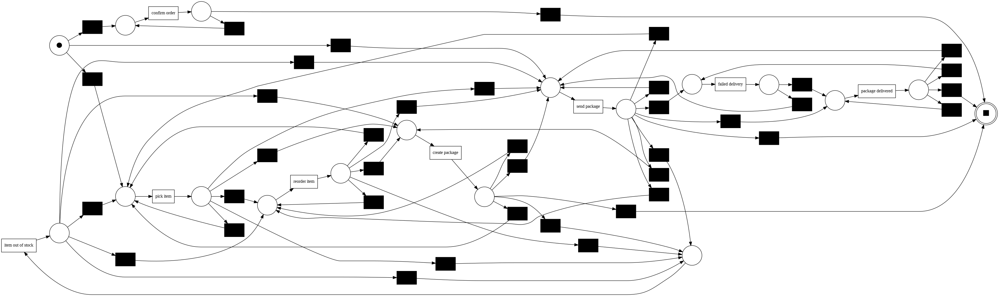

In [89]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_em, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [90]:
heu_net = pm4py.discover_heuristics_net(flattened_log_em, dependency_threshold=1)
pm4py.view_heuristics_net(heu_net)

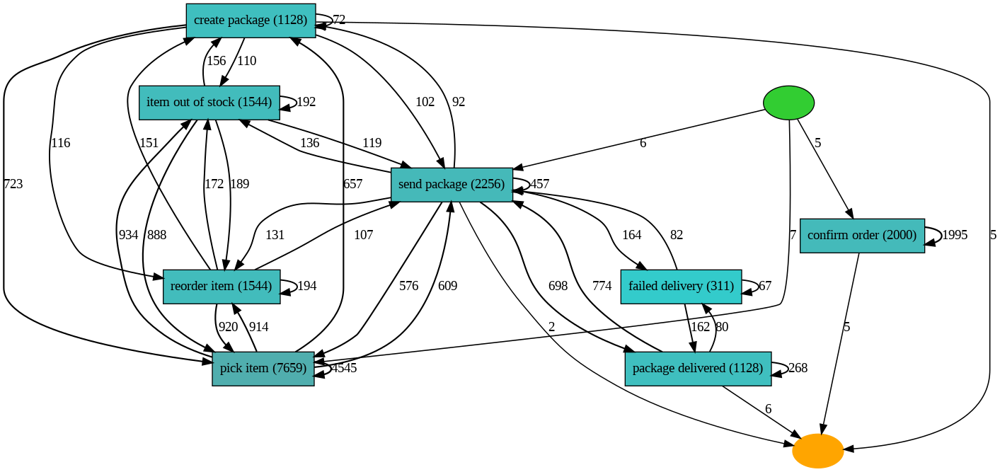

In [91]:
heu_net = pm4py.discover_heuristics_net(flattened_log_em, dependency_threshold=0.5)
pm4py.view_heuristics_net(heu_net)

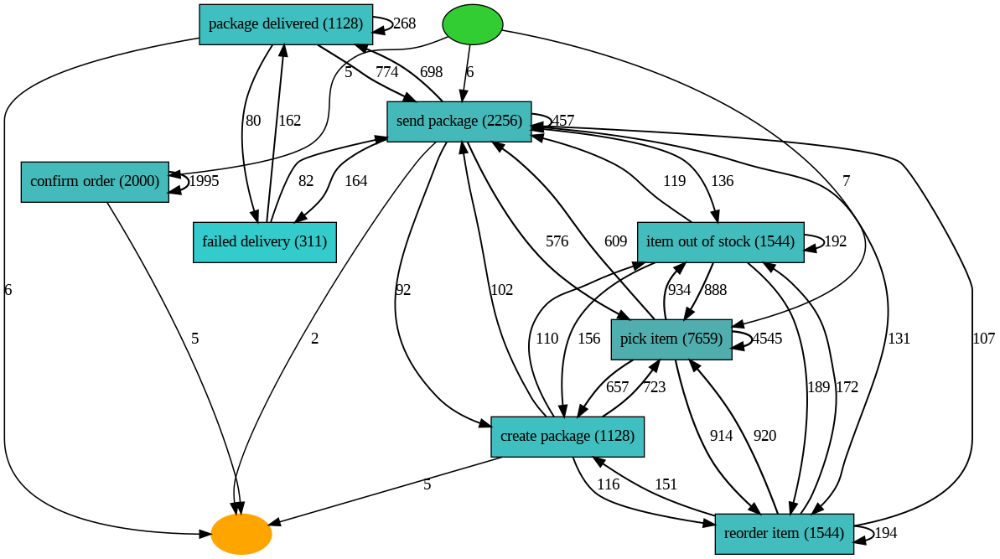

In [92]:
heu_net = pm4py.discover_heuristics_net(flattened_log_em, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)